In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import glob

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

# PMID35027529

In [2]:
em1 = sc.read_csv('PMID35027529/raw_data.csv.gz', first_column_names=True, dtype='float').T
em1

AnnData object with n_obs × n_vars = 293432 × 17277

In [179]:
meta = pd.read_csv('PMID35027529/meta.csv',index_col='Cells')
meta

/tmp/ipykernel_272037/715001500.py:1: DtypeWarning: Columns (5,9,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv('PMID35027529/meta.csv',index_col='Cells')


,SampleID,Batch,Tissue,PatientID,Gender,Disease,Stage,Age,T,N,M,CellName
Cells,,,,,,,,,,,,
2018jz1_AAACCTGAGTCCAGGA-1,2018jz1,1,Tumor,PA13,Male,LUAD,II,73.0,T2b,N1,M0,CD4
2018jz1_AAACCTGAGTGCAAGC-1,2018jz1,1,Tumor,PA13,Male,LUAD,II,73.0,T2b,N1,M0,Mo
2018jz1_AAACCTGGTCATTAGC-1,2018jz1,1,Tumor,PA13,Male,LUAD,II,73.0,T2b,N1,M0,NK
2018jz1_AAACCTGGTTCGAATC-1,2018jz1,1,Tumor,PA13,Male,LUAD,II,73.0,T2b,N1,M0,Mo
2018jz1_AAACGGGAGAAACGCC-1,2018jz1,1,Tumor,PA13,Male,LUAD,II,73.0,T2b,N1,M0,Mo
...,...,...,...,...,...,...,...,...,...,...,...,...
BT2B_TTTCGAACTGAAGA-1,BT2B,3,Tumor,DL2,NaN,LUSC,I,NaN,NaN,NaN,NaN,Mo
BT2B_TTTCTACTTTTCAC-1,BT2B,3,Tumor,DL2,NaN,LUSC,I,NaN,NaN,NaN,NaN,Mo
BT2B_TTTGACTGCTTACT-1,BT2B,3,Tumor,DL2,NaN,LUSC,I,NaN,NaN,NaN,NaN,B


In [181]:
set(emcan[emcan.obs['sour']].obs['patient'])

{'DL1',
 'DL2',
 'DL7',
 'P1',
 'P10',
 'P14',
 'P15',
 'P17',
 'P18',
 'P19',
 'P22',
 'P23',
 'P25',
 'P26',
 'P27',
 'P3',
 'P30',
 'P31',
 'P36',
 'P37',
 'P4',
 'P40',
 'P41',
 'P6',
 'P7',
 'PS01',
 'PS02',
 'PS03',
 'PS04',
 'PS05',
 'PS06',
 'PS07',
 'PS08',
 'PS09',
 'PS10',
 'PS11'}

In [10]:
em1.obs = meta
em1

AnnData object with n_obs × n_vars = 293432 × 17277
    obs: 'SampleID', 'Batch', 'Tissue', 'PatientID', 'Gender', 'Disease', 'Stage', 'Age', 'T', 'N', 'M', 'CellName'

In [18]:
set(em1.obs['CellName'])

{'ATII',
 'B',
 'Basal',
 'CD4',
 'CD8',
 'Cilia',
 'Club',
 'DC',
 'EC',
 'Epi',
 'Fib',
 'Gran',
 'Mast',
 'Mo',
 'NE',
 'NK',
 'Tregs'}

In [19]:
set(em1.obs['Disease'])

{'LUAD',
 'LUAD_Normal',
 'LULC',
 'LULC_Normal',
 'LUSC',
 'LUSC_Normal',
 'Pleiomorphic',
 'Pleiomorphic Normal'}

In [29]:
em1 = sc.concat([em1[em1.obs['Disease']=='LUSC'],em1[em1.obs['Disease']=='LUSC_Normal']])
#em1 = em1[(em1.obs['Disease']=='LUSC')|(em1.obs['Disease']=='LUSC_Normal')]
em1

AnnData object with n_obs × n_vars = 114168 × 17277
    obs: 'SampleID', 'Batch', 'Tissue', 'PatientID', 'Gender', 'Disease', 'Stage', 'Age', 'T', 'N', 'M', 'CellName', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'

In [10]:
em1.var['mt'] = em1.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(em1, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

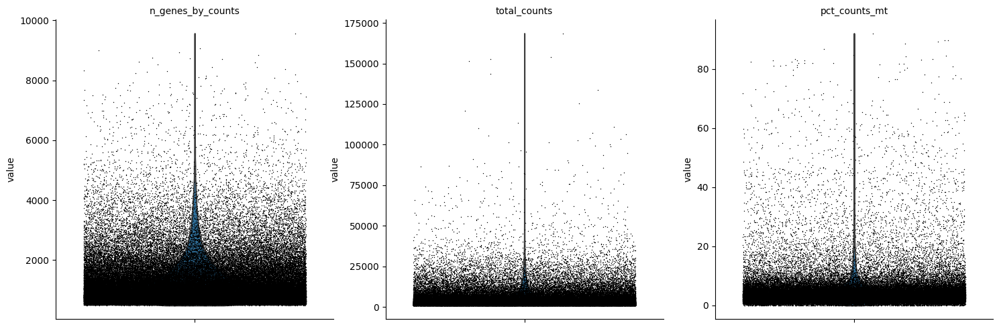

In [11]:
sc.pl.violin(em1, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [12]:
em1.write('PMID35027529_lusc_count.h5ad')

# GSE148071

In [41]:
dfs = []
for fn in sorted(glob.glob('GSE148071_RAW/*.txt.gz')):
    spl = fn.split('_')[2]
    print(spl)
    em = pd.read_csv(fn, header=0, sep='\t').T
    em.index = [spl+'_'+i.split('_')[1]+'-'+i.split('_')[0] for i in em.index]
    print(em.shape)
    dfs.append(em)
    #break

P1
(5317, 29527)
P2
(306, 29527)
P3
(7835, 29527)
P4
(4558, 29527)
P5
(2454, 29527)
P6
(3119, 29527)
P7
(3059, 29527)
P8
(1342, 29527)
P9
(3520, 29527)
P10
(3740, 29527)
P11
(574, 29527)
P12
(891, 29527)
P13
(938, 29527)
P14
(1808, 29527)
P15
(3606, 29527)
P16
(1148, 29527)
P17
(8700, 29527)
P18
(3314, 29527)
P19
(453, 29527)
P20
(429, 29527)
P21
(1968, 29527)
P22
(644, 29527)
P23
(2387, 29527)
P24
(386, 29527)
P25
(4029, 29527)
P26
(570, 29527)
P27
(707, 29527)
P28
(2373, 29527)
P29
(969, 29527)
P30
(742, 29527)
P31
(387, 29527)
P32
(595, 29527)
P33
(350, 29527)
P34
(972, 29527)
P35
(1079, 29527)
P36
(500, 29527)
P37
(2486, 29527)
P38
(1358, 29527)
P39
(1896, 29527)
P40
(1155, 29527)
P41
(6222, 29527)
P42
(1001, 29527)


In [45]:
em2 = pd.concat(dfs)
#emall = emall.fillna(0)
#emall = emall.astype(int)
em2

,PWP1,FTH1,PERP,RPL37,MT-RNR2,AKR1C3,ATP6V0E1,TPT1,RPL13A,VRK2,...,LINC02267,AC109466.1,LINC01938,AC008708.2,AL360175.1,AL121718.1,C7orf71,YWHAEP1,LINC01287,LUZP4
P1_TAGGCTAAGCCG-1,8,608,20,130,839,26,5,12,48,6,...,0,0,0,0,0,0,0,0,0,0
P1_CCGGCATATTCG-1,2,521,46,195,1515,35,7,17,66,9,...,0,0,0,0,0,0,0,0,0,0
P1_TCCGTAGACGTA-1,3,425,30,153,1309,43,10,13,53,5,...,0,0,0,0,0,0,0,0,0,0
P1_AAACTACAGTGC-1,5,547,31,119,1122,28,2,19,57,8,...,0,0,0,0,0,0,0,0,0,0
P1_GGTGAAAAGAAT-1,3,348,36,76,1048,70,3,6,35,14,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P42_CCGAATCTACTT-61,0,2,0,5,147,0,0,2,6,0,...,0,0,0,0,0,0,0,0,0,0
P42_GCGACAAATTAC-61,0,4,0,5,134,0,1,2,6,0,...,0,0,0,0,0,0,0,0,0,0
P42_TTCTACTTATTC-61,0,1,0,3,210,0,0,1,2,0,...,0,0,0,0,0,0,0,0,0,0
P42_CAACTCGGATGT-61,0,20,0,6,69,0,1,1,4,0,...,0,0,0,0,0,0,0,0,0,0


In [46]:
em2 = sc.AnnData(em2)
em2

/tmp/ipykernel_199439/3416288278.py:1: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  em2 = sc.AnnData(em2)


AnnData object with n_obs × n_vars = 89887 × 29527

In [5]:
em2.obs['sample'] = [i.split('_')[0] for i in em2.obs.index]
em2.obs

,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
P1_TAGGCTAAGCCG-1,P1,4851,27607.0,1910.0,6.918535
P1_CCGGCATATTCG-1,P1,4940,27030.0,3043.0,11.257861
P1_TCCGTAGACGTA-1,P1,4791,25281.0,2562.0,10.134092
P1_AAACTACAGTGC-1,P1,4913,26822.0,2596.0,9.678622
P1_GGTGAAAAGAAT-1,P1,4654,26128.0,2738.0,10.479179
...,...,...,...,...,...
P42_CCGAATCTACTT-61,P42,571,1173.0,207.0,17.647058
P42_GCGACAAATTAC-61,P42,568,1189.0,173.0,14.550042
P42_TTCTACTTATTC-61,P42,379,1099.0,263.0,23.930845
P42_CAACTCGGATGT-61,P42,681,1181.0,167.0,14.140558


In [8]:
ptDict = {
'P1':'LUSC',
'P2':'LUAD',
'P3':'LUSC',
'P4':'LUSC',
'P5':'LUAD',
'P6':'LUSC',
'P7':'LUSC',
'P8':'LUAD',
'P9':'LUAD',
'P10':'LUSC',
'P11':'NSCLC',
'P12':'LUAD',
'P13':'LUAD',
'P14':'LUSC',
'P15':'LUSC',
'P16':'LUAD',
'P17':'LUSC',
'P18':'LUSC',
'P19':'LUSC',
'P20':'LUAD',
'P21':'LUAD',
'P22':'LUSC',
'P23':'LUSC',
'P24':'LUAD',
'P25':'LUSC',
'P26':'LUSC',
'P27':'LUSC',
'P28':'LUAD',
'P29':'LUAD',
'P30':'LUSC',
'P31':'LUSC',
'P32':'LUAD',
'P33':'LUAD',
'P34':'LUAD',
'P35':'LUAD',
'P36':'LUSC',
'P37':'LUSC',
'P38':'LUAD',
'P39':'LUAD',
'P40':'LUSC',
'P41':'LUSC',
'P42':'NSCLC',
}
em2.obs['Disease'] = [ptDict[i] for i in em2.obs['sample']]

In [9]:
em2 = em2[(em2.obs['Disease']=='LUSC')]
em2

View of AnnData object with n_obs × n_vars = 65338 × 29527
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'Disease'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [10]:
em2.var['mt'] = em2.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(em2, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/tmp/ipykernel_211562/99131984.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  em2.var['mt'] = em2.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'


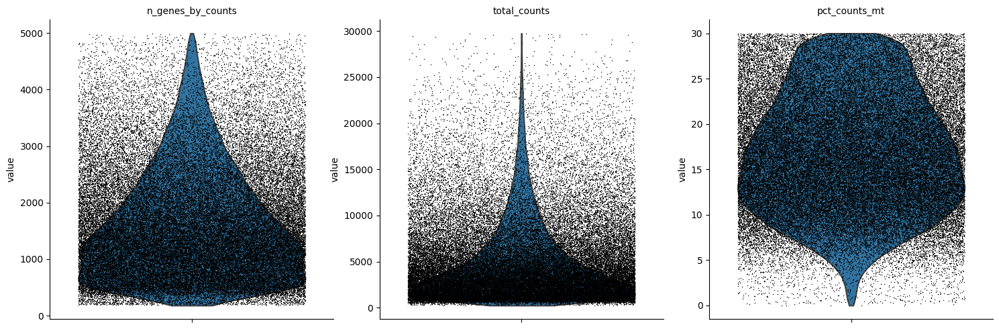

In [11]:
sc.pl.violin(em2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [12]:
em2.write('GSE148071_lusc_count.h5ad')

# merge

In [3]:
em1 = sc.read('PMID35027529_lusc_count.h5ad')
em1

AnnData object with n_obs × n_vars = 114168 × 17277
    obs: 'SampleID', 'Batch', 'Tissue', 'PatientID', 'Gender', 'Disease', 'Stage', 'Age', 'T', 'N', 'M', 'CellName', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [4]:
em2 = sc.read('GSE148071_lusc_count.h5ad')
em2

AnnData object with n_obs × n_vars = 89887 × 29527
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [13]:
em1.obs['source'] = 'wchscu'
em1.obs['sample'] = em1.obs['SampleID']
em1.obs['patient'] = em1.obs['PatientID']
em1

AnnData object with n_obs × n_vars = 114168 × 17277
    obs: 'SampleID', 'Batch', 'Tissue', 'PatientID', 'Gender', 'Disease', 'Stage', 'Age', 'T', 'N', 'M', 'CellName', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'source', 'sample', 'patient'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [14]:
em2.obs['source'] = 'shsfkyy'
em2.obs['patient'] = em2.obs['sample']
em2.obs['Tissue'] = 'unknown'
em2.obs['Stage'] = 'unknown'
em2.obs['CellName'] = 'unknown'
em2

AnnData object with n_obs × n_vars = 65338 × 29527
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'Disease', 'source', 'patient', 'Tissue', 'Stage', 'CellName'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [15]:
# total-count normalize (library-size correct) the data matrix 𝐗 to 1000,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(em1, target_sum=1e6)
# logarithmize the data
sc.pp.log1p(em1)

In [16]:
# total-count normalize (library-size correct) the data matrix 𝐗 to 1000,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(em2, target_sum=1e6)
# logarithmize the data
sc.pp.log1p(em2)

In [17]:
emcan = sc.concat([em1,em2], merge='same')
emcan.raw = emcan #save the result
emcan

AnnData object with n_obs × n_vars = 179506 × 17039
    obs: 'Tissue', 'Disease', 'Stage', 'CellName', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'source', 'sample', 'patient'
    var: 'mt'

In [18]:
emcan.obs

,Tissue,Disease,Stage,CellName,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,source,sample,patient
2018jz11_AAACCTGAGGGATCTG-1,Tumor,LUSC,I,CD4,1040,3446.0,68.0,1.973302,wchscu,2018jz11,PS02
2018jz11_AAACCTGCACATTCGA-1,Tumor,LUSC,I,CD8,922,1937.0,52.0,2.684564,wchscu,2018jz11,PS02
2018jz11_AAACCTGGTCAGGACA-1,Tumor,LUSC,I,NE,1534,4462.0,613.0,13.738234,wchscu,2018jz11,PS02
2018jz11_AAACCTGTCAAAGACA-1,Tumor,LUSC,I,B,1020,3251.0,138.0,4.244848,wchscu,2018jz11,PS02
2018jz11_AAACGGGCATACTCTT-1,Tumor,LUSC,I,B,707,1739.0,34.0,1.955147,wchscu,2018jz11,PS02
...,...,...,...,...,...,...,...,...,...,...,...
P41_TATAAGTGTCTT-59,unknown,LUSC,unknown,unknown,570,979.0,238.0,24.310520,shsfkyy,P41,P41
P41_ATGATCACGAGT-59,unknown,LUSC,unknown,unknown,534,966.0,140.0,14.492753,shsfkyy,P41,P41
P41_CTGACGGTGAAA-59,unknown,LUSC,unknown,unknown,503,959.0,46.0,4.796663,shsfkyy,P41,P41
P41_TTAACTATTCAC-59,unknown,LUSC,unknown,unknown,500,914.0,234.0,25.601751,shsfkyy,P41,P41


In [27]:
emcan.write('K135_lusc.h5ad')

In [19]:
del em1
del em2

In [4]:
all_obs = pd.read_csv('K135_lusc_all_obs.csv', index_col=0)
all_obs

,Tissue,Disease,Stage,CellName,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,source,sample,patient,leiden_0.8,leiden_1,cell type,cnv_leiden,cnv_score,cnv_status,stage_group,stage_sample,subtype
2018jz11_AAACCTGAGGGATCTG-1,Tumor,LUSC,I,CD4,1040,3446.0,68.0,1.973302,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11,Helper T cells
2018jz11_AAACCTGCACATTCGA-1,Tumor,LUSC,I,CD8,922,1937.0,52.0,2.684564,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11,Naïve T cells
2018jz11_AAACCTGGTCAGGACA-1,Tumor,LUSC,I,NE,1534,4462.0,613.0,13.738234,wchscu,2018jz11,PS02,0,2,Malignant cells,13,0.012374,tumor,I,I_2018jz11,Malignant cells
2018jz11_AAACCTGTCAAAGACA-1,Tumor,LUSC,I,B,1020,3251.0,138.0,4.244848,wchscu,2018jz11,PS02,12,13,B cells,18,0.003416,normal,I,I_2018jz11,B cells
2018jz11_AAACGGGCATACTCTT-1,Tumor,LUSC,I,B,707,1739.0,34.0,1.955147,wchscu,2018jz11,PS02,12,13,B cells,15,0.004665,normal,I,I_2018jz11,B cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P41_TATAAGTGTCTT-59,unknown,LUSC,unknown,unknown,570,979.0,238.0,24.310520,shsfkyy,P41,P41,14,15,Epithelial cells,22,0.002906,normal,III&IV,III&IV_P41,Basal cells
P41_ATGATCACGAGT-59,unknown,LUSC,unknown,unknown,534,966.0,140.0,14.492753,shsfkyy,P41,P41,9,10,Fibroblasts,3,0.014791,normal,III&IV,III&IV_P41,Fibroblasts
P41_CTGACGGTGAAA-59,unknown,LUSC,unknown,unknown,503,959.0,46.0,4.796663,shsfkyy,P41,P41,8,9,Myeloid cells,7,0.004850,normal,III&IV,III&IV_P41,Monocytes
P41_TTAACTATTCAC-59,unknown,LUSC,unknown,unknown,500,914.0,234.0,25.601751,shsfkyy,P41,P41,9,10,Fibroblasts,7,0.004850,normal,III&IV,III&IV_P41,Fibroblasts


In [5]:
len(set(all_obs['sample']))

72

In [7]:
len(set(all_obs[all_obs['source']=='wchscu']['sample']))

50

In [8]:
len(set(all_obs[all_obs['source']=='shsfkyy']['sample']))

22

# cell annotation

In [20]:
# extract top highly variable genes
sc.pp.highly_variable_genes(emcan, flavor='seurat', n_top_genes=2000, span=0.3, n_bins=20, min_mean=0.0125, max_mean=3, min_disp=0.5)
# actually do the filtering
emcan = emcan[:, emcan.var.highly_variable]
# regress out effects of total counts per cell, percentages of mitochondrial gene counts and heat shock protein (HSP) related gene counts 
sc.pp.regress_out(emcan, ['total_counts', 'pct_counts_mt'])
# scale data
sc.pp.scale(emcan, max_value=10)
# run dimensionality reduction
sc.pp.pca(emcan, svd_solver='arpack', n_comps=20)

/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/hour/miniconda3/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitMo

In [21]:
# perform Harmony using PCA results to adjust the PCs
sc.external.pp.harmony_integrate(emcan, 'sample', basis='X_pca', adjusted_basis='X_pca_harmony', max_iter_harmony=100)

2023-06-28 14:24:27,204 - harmonypy - INFO - Iteration 1 of 100
2023-06-28 14:26:46,792 - harmonypy - INFO - Iteration 2 of 100
2023-06-28 14:29:07,786 - harmonypy - INFO - Iteration 3 of 100
2023-06-28 14:31:37,447 - harmonypy - INFO - Iteration 4 of 100
2023-06-28 14:34:00,695 - harmonypy - INFO - Iteration 5 of 100
2023-06-28 14:36:28,590 - harmonypy - INFO - Iteration 6 of 100
2023-06-28 14:38:55,715 - harmonypy - INFO - Iteration 7 of 100
2023-06-28 14:41:25,452 - harmonypy - INFO - Iteration 8 of 100
2023-06-28 14:43:06,100 - harmonypy - INFO - Iteration 9 of 100
2023-06-28 14:44:48,125 - harmonypy - INFO - Iteration 10 of 100
2023-06-28 14:47:14,839 - harmonypy - INFO - Iteration 11 of 100
2023-06-28 14:49:43,754 - harmonypy - INFO - Iteration 12 of 100
2023-06-28 14:51:11,133 - harmonypy - INFO - Iteration 13 of 100
2023-06-28 14:52:40,503 - harmonypy - INFO - Iteration 14 of 100
2023-06-28 14:54:04,631 - harmonypy - INFO - Iteration 15 of 100
2023-06-28 14:56:20,220 - harmonyp

In [22]:
# perform BBKNN using Harmony results
sc.external.pp.bbknn(emcan, batch_key='sample', use_rep='X_pca_harmony', n_pcs=20)

/data/hour/miniconda3/lib/python3.8/site-packages/numba/core/cpu.py:97: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ContextualVersionConflict((numpy 1.22.4 (/data/hour/miniconda3/lib/python3.8/site-packages), Requirement.parse('numpy<1.22,>=1.18'), {'numba'}))'.
  numba.core.entrypoints.init_all()
2023-06-28 15:13:07.287299: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-06-28 15:13:07.287421: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [ ]:
# obtain UMAP plot
sc.tl.umap(emcan)

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


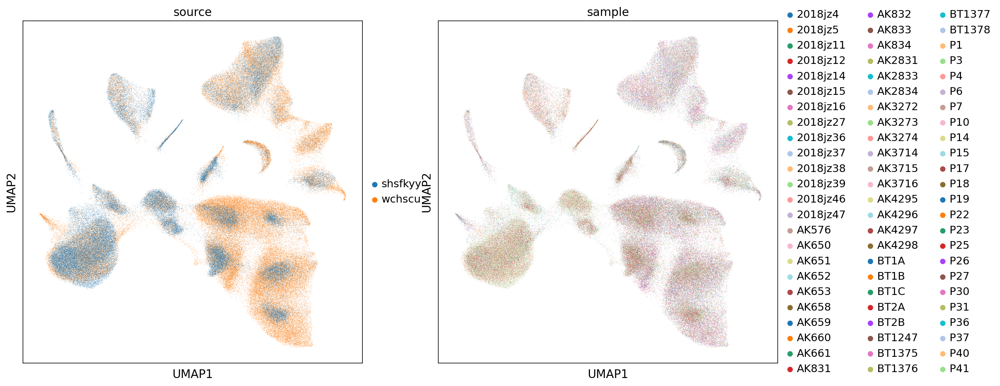

In [23]:
sc.settings.set_figure_params(fontsize=15, figsize=(8,8))
sc.pl.umap(emcan, color=['source','sample'], ncols=2, palette=sc.pl.palettes.vega_20_scanpy)

/data/hour/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


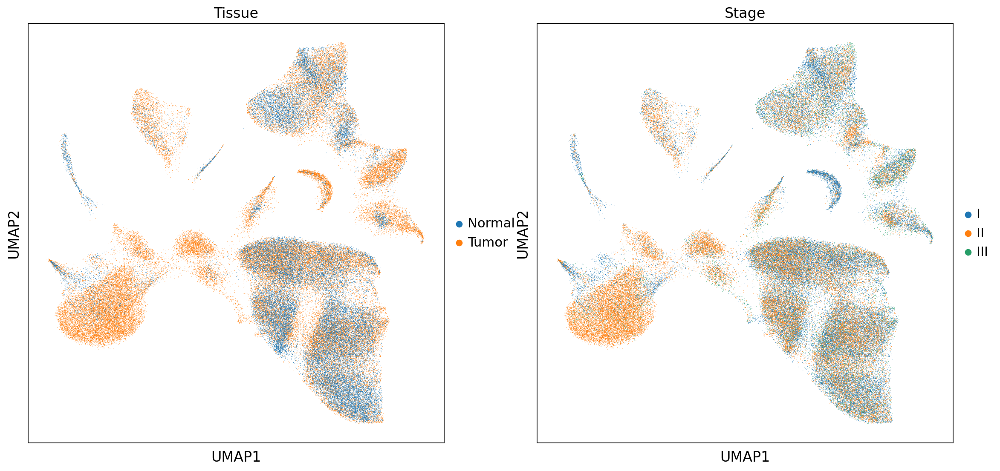

In [25]:
sc.pl.umap(emcan[emcan.obs['source']=='wchscu'], color=['Tissue','Stage'], ncols=2, palette=sc.pl.palettes.vega_20_scanpy)

/data/hour/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


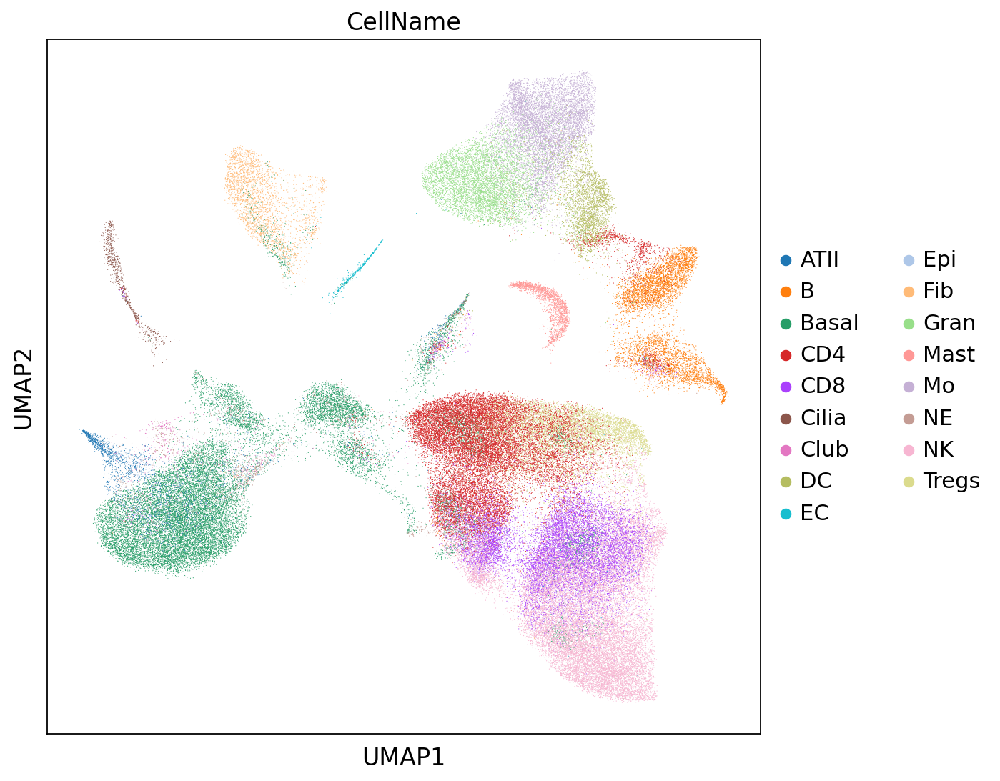

In [26]:
sc.pl.umap(emcan[emcan.obs['source']=='wchscu'], color='CellName', ncols=2, palette=sc.pl.palettes.vega_20_scanpy)

In [27]:
emcan.write('K135_lusc.h5ad')

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


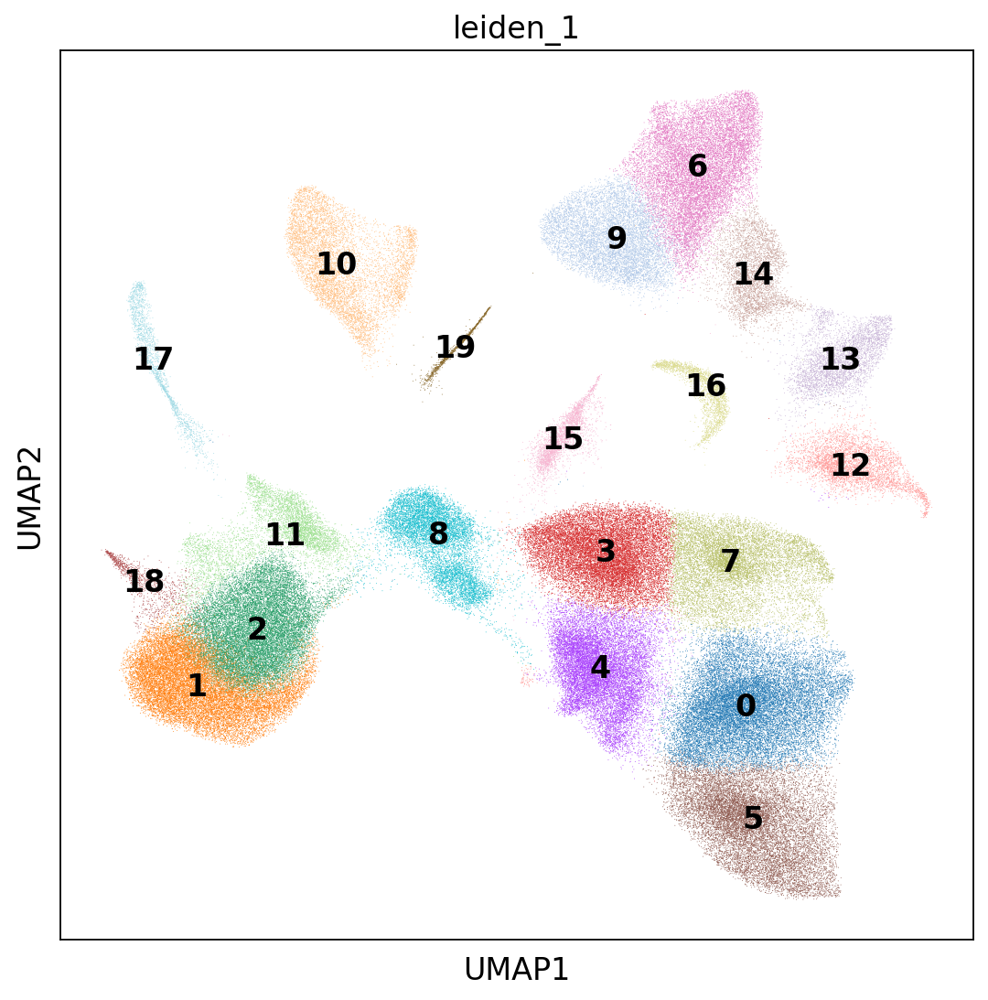

In [29]:
# leiden clustering
sc.tl.leiden(emcan, resolution=1, random_state=0, key_added='leiden_1')# check the clusters on the UMAP
sc.pl.umap(emcan,color=['leiden_1'],legend_loc='on data',palette=sc.pl.palettes.vega_20_scanpy)

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


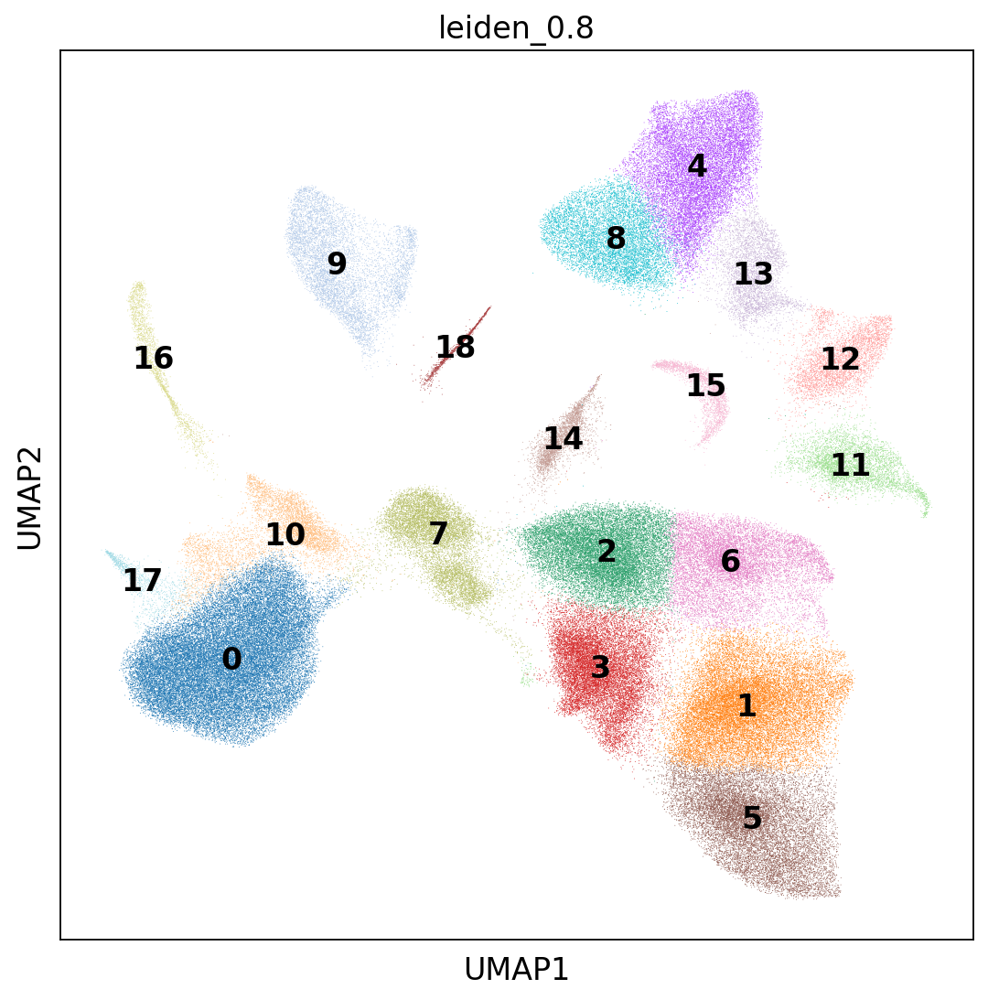

In [28]:
# leiden clustering
sc.tl.leiden(emcan, resolution=0.8, random_state=0, key_added='leiden_0.8')# check the clusters on the UMAP
sc.pl.umap(emcan,color=['leiden_0.8'],legend_loc='on data',palette=sc.pl.palettes.vega_20_scanpy)

categories: 0, 1, 2, etc.
var_group_labels: B cells, Follicular B cells, Plasma cells, etc.


/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


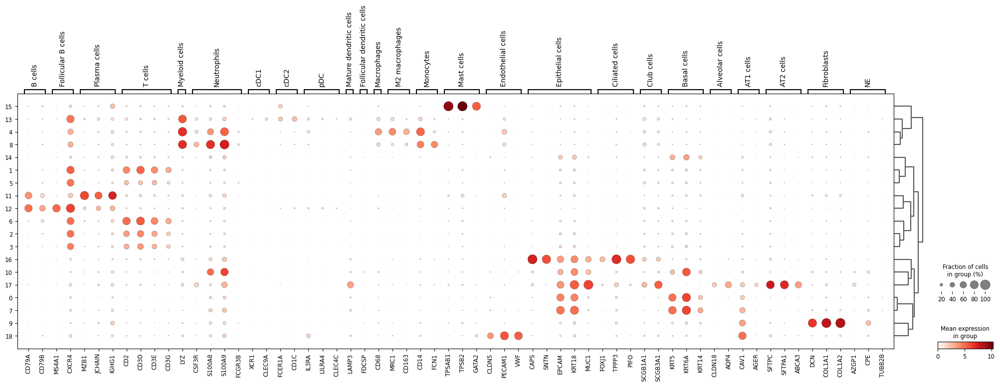

In [5]:
markerDict = {
'B cells':['CD79A','CD79B'],
'Follicular B cells':['MS4A1','CXCR4'],##
'Plasma cells':['MZB1','JCHAIN','IGHG1'],##

'T cells':['CD2','CD3D','CD3E','CD3G'],##############################
#'CD4':[],
#'CD8':[],
#'NK':[],
#'Tregs':[],

'Myeloid cells':['LYZ'],################################
#'Granulocytes':[],
'Neutrophils':['CSF3R','S100A8','S100A9','FCGR3B'],##
#'DC':[],
'cDC1':['XCR1','CLEC9A'],##
'cDC2':['FCER1A','CD1C'],##
'pDC':['IL3RA','LILRA4','CLEC4C'],##
'Mature dendritic cells':['LAMP3'],##
'Follicular dendritic cells':['FDCSP'],##
'Macrophages':['CD68'],##
'M2 macrophages':['MRC1','CD163'],##
'Monocytes':['CD14','FCN1'],

'Mast cells':['TPSAB1','TPSB2','GATA2'],

'Endothelial cells':['CLDN5','PECAM1','VWF'],
#'Vein endothelial cells':['ACKR1'],##
#'Artery endothelial cells':['GJA5'],##
#'Lymphatic endothelial cells':['PROX1','PDPN'],##
#'Tip cells':['DLL4','KCNE3','ESM1','ANGPT2'],##

'Epithelial cells':['CAPS','SNTN',"EPCAM","KRT18","MUC1"],#####################
'Ciliated cells':['FOXJ1','TPPP3','PIFO'],
'Club cells':['SCGB1A1','SCGB3A1'],
'Basal cells':['KRT5','KRT6A','KRT14'],
'Alveolar cells':['CLDN18','AQP4'],##
'AT1 cells':['CAV1','AGER'],
'AT2 cells':['SFTPC','SFTPA1','ABCA3'],

'Fibroblasts':['DCN','COL1A1','COL1A2'],
#'Pericytes':['RGS5','CSPG4'],##
#'Myofibroblasts':['ACTA2','MYH11'],##

'NE':["AZGP1","CPE","TUBB2B"],#X
}
sc.pl.dotplot(emcan, markerDict, groupby='leiden_0.8', dendrogram=True)

... storing 'cell type' as categorical
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


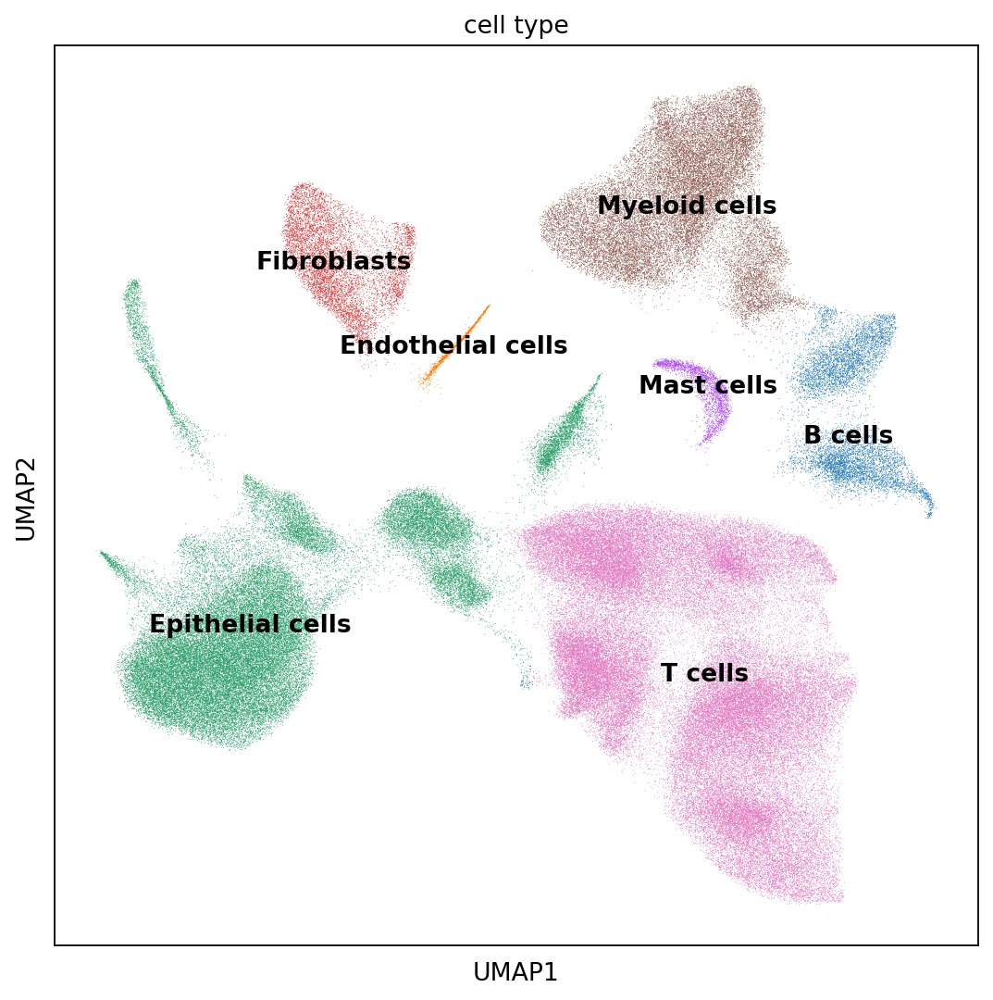

In [108]:
annDict = {
    '0':'Epithelial cells',
    '1':'T cells',
    '2':'T cells',
    '3':'T cells',
    '4':'Myeloid cells',
    '5':'T cells',
    '6':'T cells',
    '7':'Epithelial cells',
    '8':'Myeloid cells',
    '9':'Fibroblasts',
    '10':'Epithelial cells',
    '11':'B cells',
    '12':'B cells',
    '13':'Myeloid cells',
    '14':'Epithelial cells',
    '15':'Mast cells',
    '16':'Epithelial cells',
    '17':'Epithelial cells',
    '18':'Endothelial cells',
}
emcan.obs['cell type'] = [annDict[i] for i in emcan.obs['leiden_0.8']]
sc.settings.set_figure_params(fontsize=12, figsize=(8,8))
sc.pl.umap(emcan,color=['cell type'],legend_loc='on data',palette=sc.pl.palettes.vega_20_scanpy)

In [36]:
pd.crosstab(index=emcan.obs['cell type'],columns=emcan.obs['CellName'])

CellName,ATII,B,Basal,CD4,CD8,Cilia,Club,DC,EC,Epi,Fib,Gran,Mast,Mo,NE,NK,Tregs,unknown
cell type,,,,,,,,,,,,,,,,,,
B cells,0,5781,107,708,61,0,0,43,0,0,4,3,1,3,26,115,7,1961
Endothelial cells,0,1,21,0,0,0,0,0,350,0,0,0,0,0,1,0,0,722
Epithelial cells,1752,16,18960,215,158,751,445,17,2,323,56,5,3,31,1158,143,15,32211
Fibroblasts,0,1,339,2,0,0,0,0,6,0,2655,0,0,1,8,0,0,4259
Mast cells,0,0,3,3,0,0,0,0,0,0,0,0,1829,0,0,5,0,452
Myeloid cells,6,35,44,411,4,5,0,3078,3,1,6,6062,8,7549,10,9,1,9777
T cells,7,120,2267,18023,12018,3,6,58,10,3,7,8,56,4,105,20863,7244,15956


In [35]:
emcan.write('K135_lusc.h5ad')

In [92]:
T_cells = emcan[(emcan.obs['cell type']=='T cells')]
T_cells.write('K135_lusc_T.h5ad')

/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [93]:
Mye_cells = emcan[(emcan.obs['cell type']=='Myeloid cells')]
Mye_cells.write('K135_lusc_Mye.h5ad')

/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [140]:
Epi_cells = emcan[(emcan.obs['cell type']=='Epithelial cells')]
Epi_cells.write('K135_lusc_Epi.h5ad')#save after CNV

# CNV

In [5]:
# find out cancer cell
import infercnvpy as cnv

In [7]:
cnv.io.genomic_position_from_gtf(
    "/data/hour/gencode.v32.primary_assembly.annotation.gtf", 
    adata=emcan, gtf_gene_id='gene_name', adata_gene_id=None, inplace=True)
emcan.var

/data/hour/miniconda3/lib/python3.8/site-packages/gtfparse/read_gtf.py:82: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  chunk_iterator = pd.read_csv(
/data/hour/miniconda3/lib/python3.8/site-packages/gtfparse/read_gtf.py:82: FutureWarning: The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  chunk_iterator = pd.read_csv(
INFO:root:Extracted GTF attributes: ['gene_id', 'gene_name']


,mt,highly_variable,means,dispersions,dispersions_norm,mean,std,chromosome,start,end,gene_id,gene_name
A1BG-AS1,False,True,1.382339,6.734631,1.364290,3.078505e-11,0.550204,chr19,58347718.0,58355455.0,ENSG00000268895.6,A1BG-AS1
A2M,False,True,4.448747,8.383302,3.670615,3.839307e-11,1.639922,chr12,9067664.0,9116229.0,ENSG00000175899.14,A2M
AARD,False,True,0.720596,6.482240,1.071231,-7.242801e-12,0.325350,chr8,116938207.0,116944487.0,ENSG00000205002.4,AARD
ABCA1,False,True,3.571841,6.582357,0.703920,-6.666905e-11,1.615476,chr9,104781006.0,104928155.0,ENSG00000165029.16,ABCA1
ABCA12,False,True,1.053961,6.337259,0.644429,2.129969e-11,0.440787,chr2,214931542.0,215138626.0,ENSG00000144452.15,ABCA12
...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF876P,False,True,0.376756,6.317709,0.903555,1.163449e-11,0.200819,chr4,212610.0,255985.0,ENSG00000198155.5,ZNF876P
ZNF91,False,True,2.620057,6.918785,1.756004,-1.734952e-11,1.073726,chr19,23304991.0,23395471.0,ENSG00000167232.14,ZNF91
ZNF92,False,True,2.363746,6.981728,1.908613,-1.683069e-11,0.955757,chr7,65373799.0,65401135.0,ENSG00000146757.13,ZNF92
ZSCAN16,False,True,1.518986,6.524403,0.861968,-6.497594e-11,0.596406,chr6,28124609.0,28130082.0,ENSG00000196812.5,ZSCAN16


In [43]:
# We provide all immune cell types as "normal cells".
cnv.tl.infercnv(
    emcan,
    reference_key="cell type",
    reference_cat=['B cells','T cells','Myeloid cells','Mast cells'],
    window_size=250,
)

  0%|          | 0/36 [00:00<?, ?it/s]

/data/hour/miniconda3/lib/python3.8/site-packages/infercnvpy/pl/_chromosome_heatmap.py:59: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  tmp_adata = AnnData(X=adata.obsm[f"X_{use_rep}"], obs=adata.obs)


/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2406: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


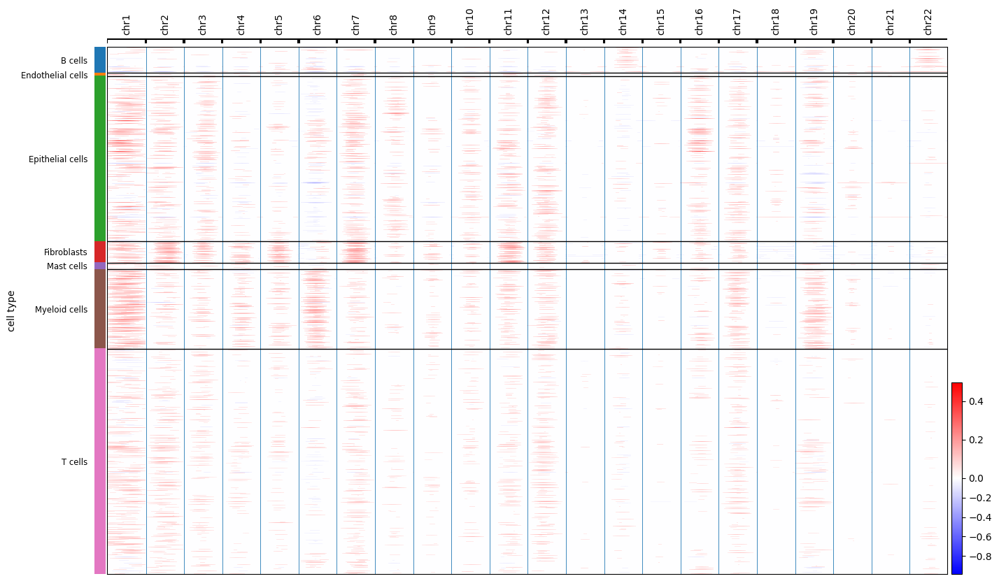

In [44]:
# plot smoothed gene expression by cell-type and chromosome
cnv.pl.chromosome_heatmap(emcan, groupby="cell type", save='-cnv1.pdf')

In [45]:
# clustering by CNV profiles
cnv.tl.pca(emcan)
cnv.pp.neighbors(emcan)
cnv.tl.leiden(emcan)

/data/hour/miniconda3/lib/python3.8/site-packages/infercnvpy/pl/_chromosome_heatmap.py:59: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  tmp_adata = AnnData(X=adata.obsm[f"X_{use_rep}"], obs=adata.obs)


         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2406: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


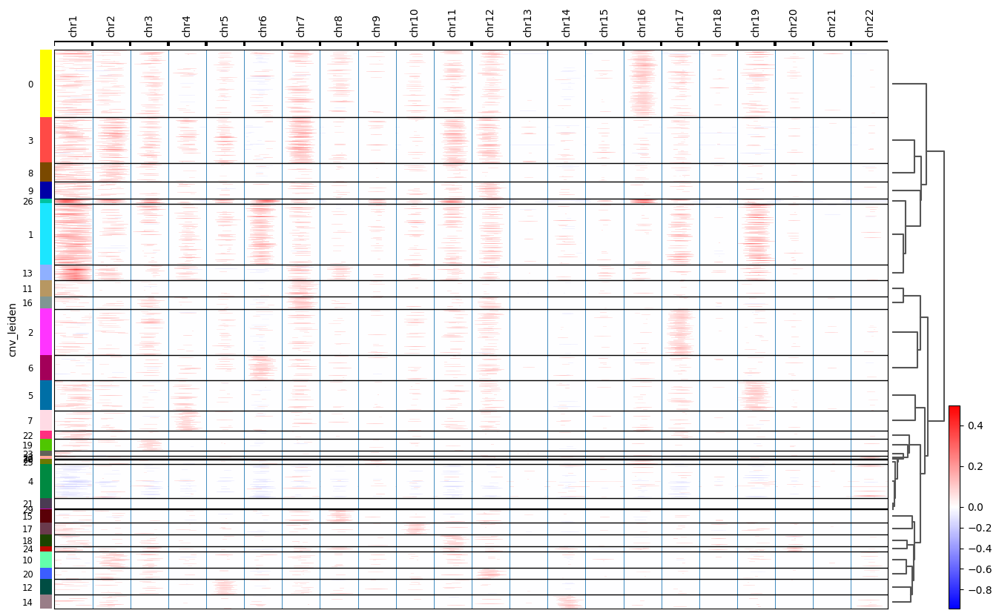

In [46]:
# plot the chromosome heatmap by CNV clusters
cnv.pl.chromosome_heatmap(emcan, groupby="cnv_leiden", dendrogram=True,save='-cnv2.pdf')

In [47]:
# prepare umap
cnv.tl.umap(emcan)
# computes a summary score that quantifies the amount of copy number variation per cluster
cnv.tl.cnv_score(emcan)

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


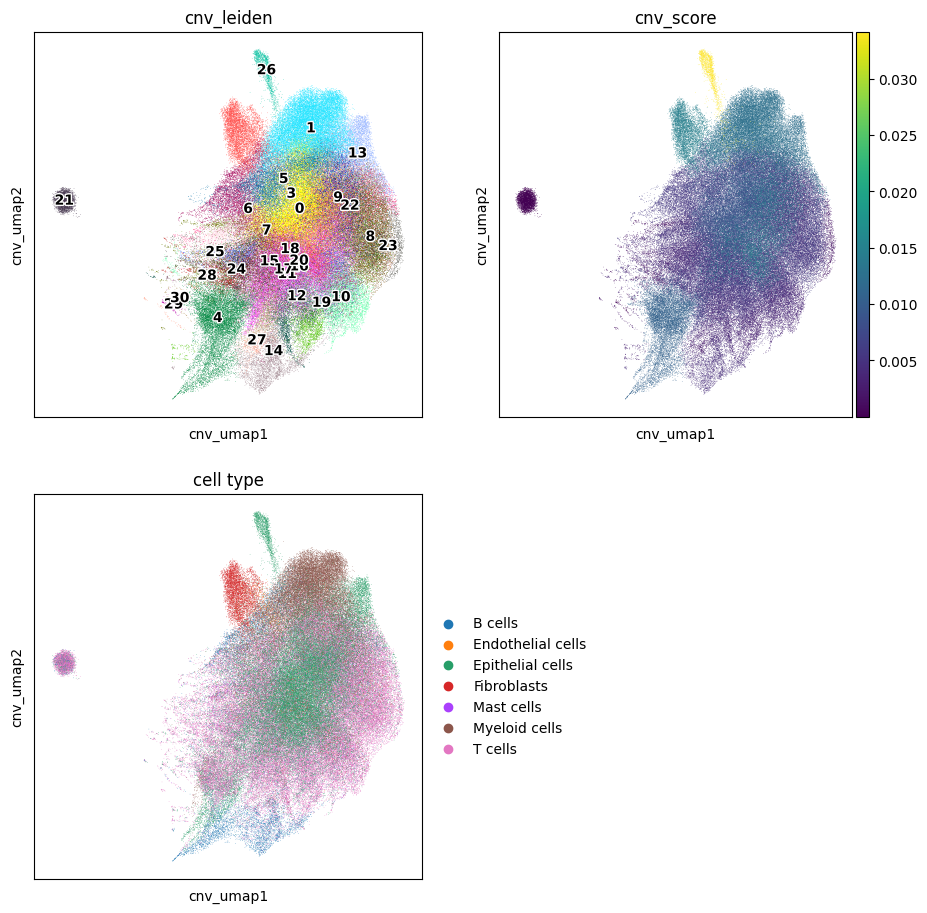

In [48]:
# umap plot for CNV clusters, CNV scores and annotations
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(emcan ,color="cnv_leiden", legend_loc="on data", legend_fontoutline=2, ax=ax1, show=False)
cnv.pl.umap(emcan, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(emcan, color="cell type", ax=ax3)

In [25]:
emcan.obs['cell_type'] = list(emcan.obs['cell type'])
emcan.obs.loc[emcan.obs["cell_type"]=="Malignant cells",'cell_type'] = "Epithelial cells"
set(emcan.obs['cell_type'])

{'B cells',
 'Endothelial cells',
 'Epithelial cells',
 'Fibroblasts',
 'Mast cells',
 'Myeloid cells',
 'T cells'}

... storing 'cell_type' as categorical
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


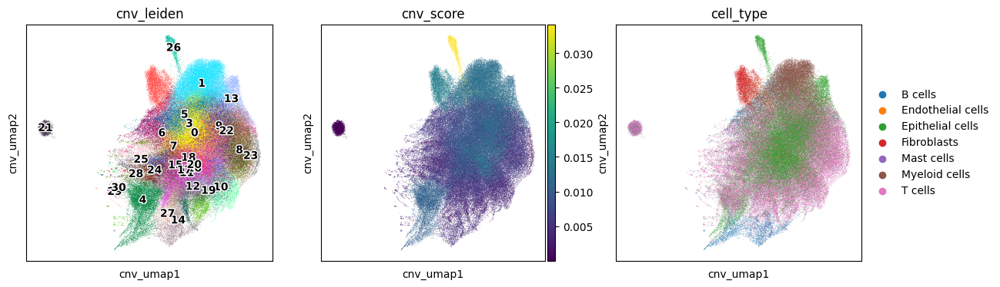

In [26]:
# umap plot for CNV clusters, CNV scores and annotations
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 4))
cnv.pl.umap(emcan ,color="cnv_leiden", legend_loc="on data", legend_fontoutline=2, ax=ax1, show=False)
cnv.pl.umap(emcan, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(emcan, color="cell_type", ax=ax3)

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


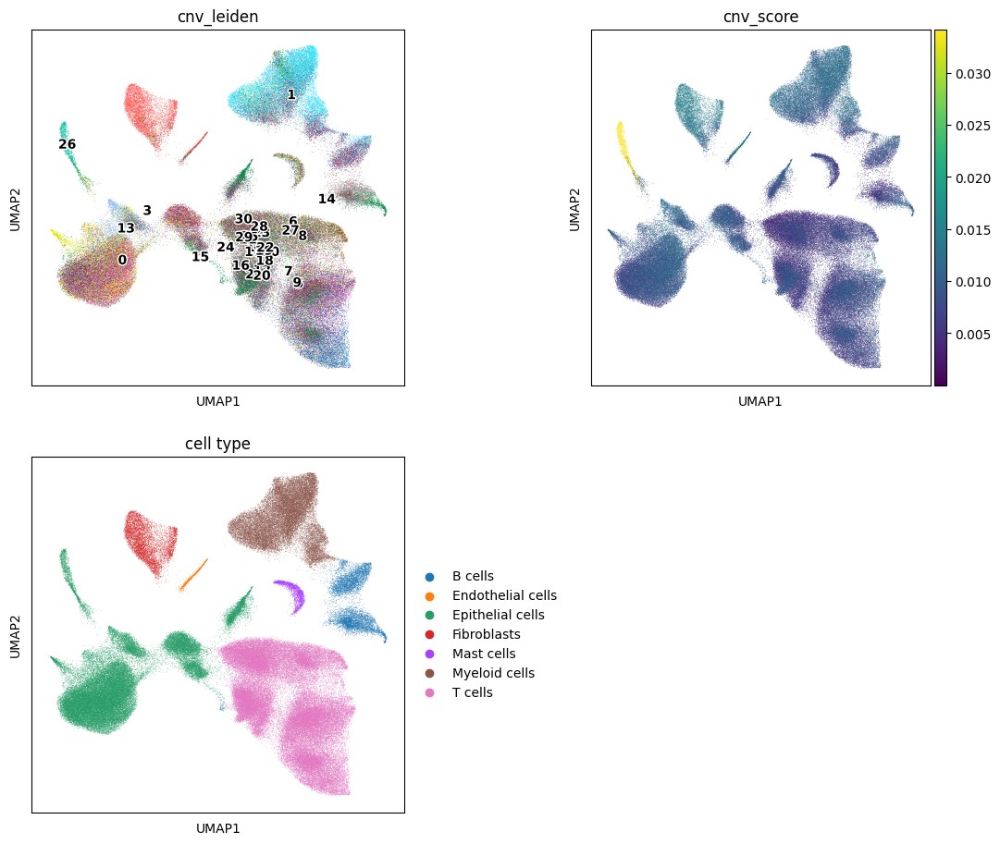

In [49]:
# transcriptomics-based UMAP plot for CNV clusters, CNV scores and annotations
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(13, 11), gridspec_kw=dict(wspace=0.5))
ax4.axis("off")
sc.pl.umap(emcan ,color="cnv_leiden", legend_loc="on data", legend_fontoutline=2, ax=ax1, show=False)
sc.pl.umap(emcan, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(emcan, color="cell type", ax=ax3)

In [113]:
emcan.obs.loc[:,['cnv_leiden','cnv_score']].groupby('cnv_leiden').mean().sort_values(by="cnv_score",ascending=False)

,cnv_score
cnv_leiden,
26,0.034191
3,0.014791
1,0.012666
13,0.012374
4,0.010677
0,0.008762
9,0.006306
8,0.006258
5,0.006202


In [109]:
# annotate tumor cells based on CNV profiles
emcan.obs["cnv_status"] = ["tumor" if (emcan.obs.loc[i,"cnv_leiden"] in ["26",'3','13']) and (emcan.obs.loc[i,"cell type"]=='Epithelial cells') 
                           else "normal" 
                           for i in emcan.obs.index]
set(emcan.obs["cnv_status"])

{'normal', 'tumor'}

... storing 'cnv_status' as categorical
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


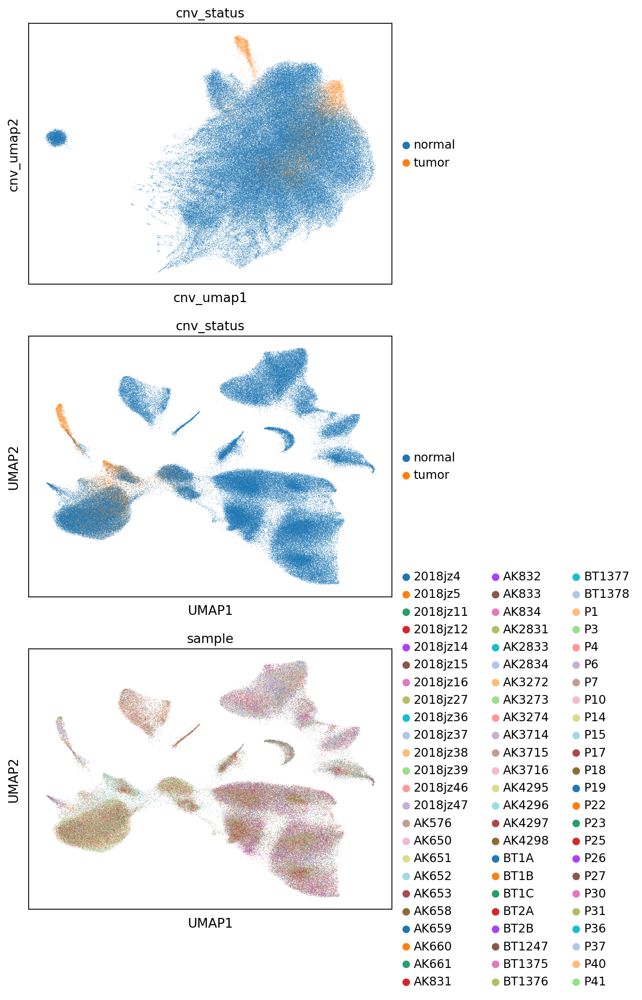

In [110]:
# two kinds of umap plots for tumor and normal cells 
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(6, 15), gridspec_kw=dict(wspace=0.5))
cnv.pl.umap(emcan, color="cnv_status", ax=ax1, show=False)
sc.pl.umap(emcan, color="cnv_status", ax=ax2, show=False)
sc.pl.umap(emcan, color="sample", ax=ax3)

In [111]:
emcan.obs["cell type"] = ["Malignant cells" if emcan.obs.loc[i,"cnv_status"]=="tumor" 
                          else emcan.obs.loc[i,"cell type"] 
                          for i in emcan.obs.index] 
#print(emcan.uns['leiden_colors'])
#print(emcan.uns['leiden'])
print(len(emcan.obs.loc[emcan.obs["cell type"] == "Malignant cells",]))
print(len(emcan.obs.loc[emcan.obs["cell type"] == "Epithelial cells",]))

9611
46650


... storing 'cell type' as categorical


/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


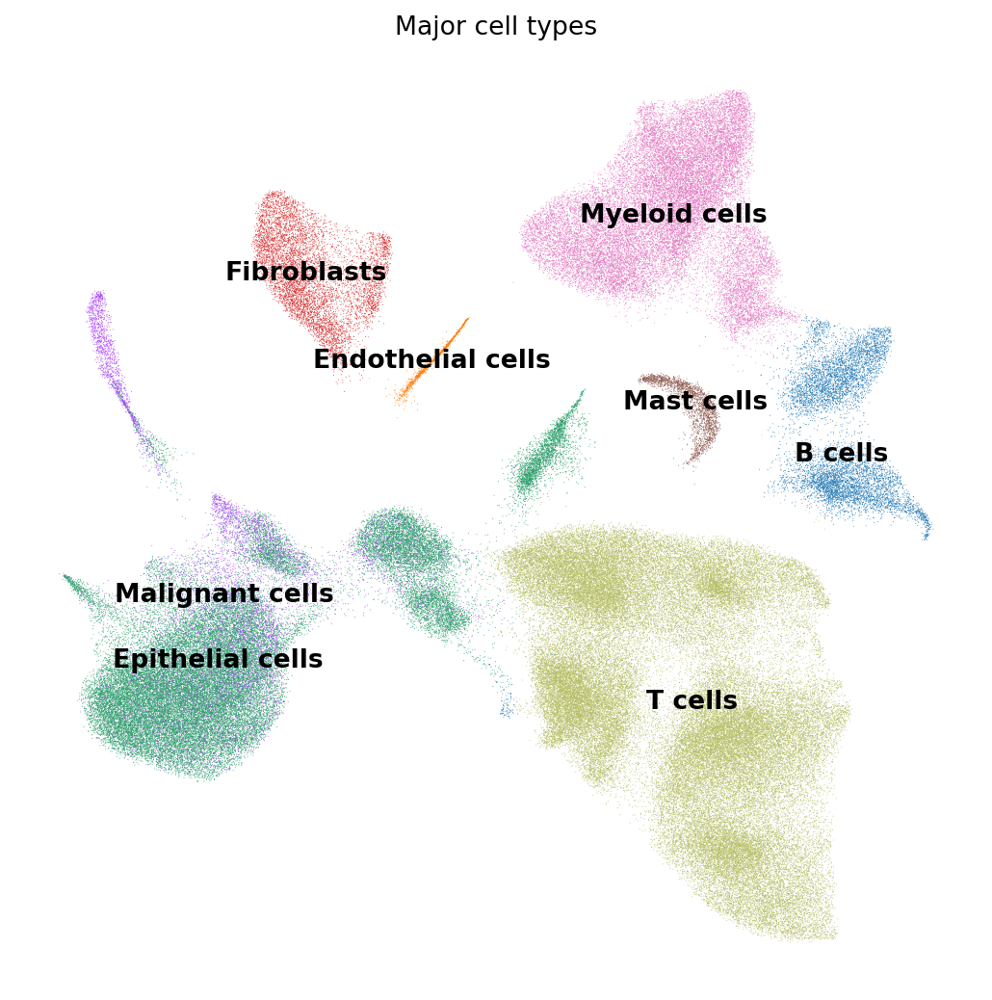

In [112]:
sc.settings.set_figure_params(fontsize=12, figsize=(8, 8))
#sc.pl.umap(emcan, color=['cell_type','leiden'], legend_loc='on data', title='Major cell types', frameon=False)
sc.pl.umap(emcan, color=['cell type'], legend_loc='on data', title='Major cell types', frameon=False, save='-cell type')

In [114]:
emcan.write('K135_lusc.h5ad')

In [173]:
emcan.obs.to_csv('K135_lusc_all_obs.csv', index=True, header=True)

In [176]:
Mal_cells = emcan[(emcan.obs['cell type']=='Malignant cells')]
Mal_cells.write('K135_lusc_Malignant.h5ad')#save after CNV

# proportion analysis

In [67]:
set(emcan.obs['Stage'])

{'I', 'II', 'III', 'unknown'}

In [68]:
set(emcan.obs['Tissue'])

{'Normal', 'Tumor', 'unknown'}

In [69]:
stageDict = {
'I':'I',
'II':'II',
'III':'III&IV',
'unknown':'III&IV',
}
emcan.obs['stage_group'] = ['Norm' if emcan.obs.loc[i,'Tissue']=='Normal' 
                            else stageDict[emcan.obs.loc[i,'Stage']] 
                            for i in emcan.obs.index]
set(emcan.obs['stage_group'])

{'I', 'II', 'III&IV', 'Norm'}

In [70]:
emcan.obs['stage_sample'] = [emcan.obs.loc[i,'stage_group']+'_'+emcan.obs.loc[i,'sample'] for i in emcan.obs.index]
emcan.obs

,Tissue,Disease,Stage,CellName,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,source,sample,patient,leiden_0.8,leiden_1,cell type,cnv_leiden,cnv_score,cnv_status,stage_group,stage_sample
2018jz11_AAACCTGAGGGATCTG-1,Tumor,LUSC,I,CD4,1040,3446.0,68.0,1.973302,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11
2018jz11_AAACCTGCACATTCGA-1,Tumor,LUSC,I,CD8,922,1937.0,52.0,2.684564,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11
2018jz11_AAACCTGGTCAGGACA-1,Tumor,LUSC,I,NE,1534,4462.0,613.0,13.738234,wchscu,2018jz11,PS02,0,2,Epithelial cells,13,0.012374,normal,I,I_2018jz11
2018jz11_AAACCTGTCAAAGACA-1,Tumor,LUSC,I,B,1020,3251.0,138.0,4.244848,wchscu,2018jz11,PS02,12,13,B cells,18,0.003416,normal,I,I_2018jz11
2018jz11_AAACGGGCATACTCTT-1,Tumor,LUSC,I,B,707,1739.0,34.0,1.955147,wchscu,2018jz11,PS02,12,13,B cells,15,0.004665,normal,I,I_2018jz11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P41_TATAAGTGTCTT-59,unknown,LUSC,unknown,unknown,570,979.0,238.0,24.310520,shsfkyy,P41,P41,14,15,Epithelial cells,22,0.002906,normal,III&IV,III&IV_P41
P41_ATGATCACGAGT-59,unknown,LUSC,unknown,unknown,534,966.0,140.0,14.492753,shsfkyy,P41,P41,9,10,Fibroblasts,3,0.014791,normal,III&IV,III&IV_P41
P41_CTGACGGTGAAA-59,unknown,LUSC,unknown,unknown,503,959.0,46.0,4.796663,shsfkyy,P41,P41,8,9,Myeloid cells,7,0.004850,normal,III&IV,III&IV_P41
P41_TTAACTATTCAC-59,unknown,LUSC,unknown,unknown,500,914.0,234.0,25.601751,shsfkyy,P41,P41,9,10,Fibroblasts,7,0.004850,normal,III&IV,III&IV_P41


In [71]:
ctList = list(set(emcan.obs['cell type']))
spList = sorted(list(set(emcan.obs['stage_sample'])))
spList

['III&IV_2018jz16',
 'III&IV_2018jz27',
 'III&IV_2018jz37',
 'III&IV_2018jz38',
 'III&IV_P1',
 'III&IV_P10',
 'III&IV_P14',
 'III&IV_P15',
 'III&IV_P17',
 'III&IV_P18',
 'III&IV_P19',
 'III&IV_P22',
 'III&IV_P23',
 'III&IV_P25',
 'III&IV_P26',
 'III&IV_P27',
 'III&IV_P3',
 'III&IV_P30',
 'III&IV_P31',
 'III&IV_P36',
 'III&IV_P37',
 'III&IV_P4',
 'III&IV_P40',
 'III&IV_P41',
 'III&IV_P6',
 'III&IV_P7',
 'II_2018jz4',
 'II_AK2831',
 'II_AK2833',
 'II_AK2834',
 'II_AK3272',
 'II_AK3273',
 'II_AK3274',
 'II_AK4295',
 'II_AK4296',
 'II_AK4297',
 'II_AK4298',
 'II_AK576',
 'II_BT1A',
 'II_BT1B',
 'II_BT1C',
 'I_2018jz11',
 'I_2018jz12',
 'I_2018jz46',
 'I_AK658',
 'I_AK659',
 'I_AK660',
 'I_AK661',
 'I_BT1375',
 'I_BT1376',
 'I_BT1377',
 'I_BT2A',
 'I_BT2B',
 'Norm_2018jz14',
 'Norm_2018jz15',
 'Norm_2018jz36',
 'Norm_2018jz39',
 'Norm_2018jz47',
 'Norm_2018jz5',
 'Norm_AK3714',
 'Norm_AK3715',
 'Norm_AK3716',
 'Norm_AK650',
 'Norm_AK651',
 'Norm_AK652',
 'Norm_AK653',
 'Norm_AK831',
 'Norm_

In [115]:
sizes = emcan.obs.groupby(['cell type', 'stage_sample']).size()
props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
props = props.pivot(columns='stage_sample', index='cell type').T
props.index = props.index.droplevel(0)
print(props.index)
props.fillna(0, inplace=True)
props = props.loc[spList,reversed(ctList)]
props

CategoricalIndex(['III&IV_2018jz16', 'III&IV_2018jz27', 'III&IV_2018jz37',
                  'III&IV_2018jz38', 'III&IV_P1', 'III&IV_P3', 'III&IV_P4',
                  'III&IV_P6', 'III&IV_P7', 'III&IV_P10', 'III&IV_P14',
                  'III&IV_P15', 'III&IV_P17', 'III&IV_P18', 'III&IV_P19',
                  'III&IV_P22', 'III&IV_P23', 'III&IV_P25', 'III&IV_P26',
                  'III&IV_P27', 'III&IV_P30', 'III&IV_P31', 'III&IV_P36',
                  'III&IV_P37', 'III&IV_P40', 'III&IV_P41', 'II_2018jz4',
                  'II_AK576', 'II_AK2831', 'II_AK2833', 'II_AK2834',
                  'II_AK3272', 'II_AK3273', 'II_AK3274', 'II_AK4295',
                  'II_AK4296', 'II_AK4297', 'II_AK4298', 'II_BT1A', 'II_BT1B',
                  'II_BT1C', 'I_2018jz11', 'I_2018jz12', 'I_2018jz46',
                  'I_AK658', 'I_AK659', 'I_AK660', 'I_AK661', 'I_BT2A',
                  'I_BT2B', 'I_BT1375', 'I_BT1376', 'I_BT1377', 'Norm_2018jz5',
                  'Norm_2018jz14', 'Norm

/tmp/ipykernel_272037/2949361840.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index()


cell type,B cells,Fibroblasts,Malignant cells,Epithelial cells,Endothelial cells,Myeloid cells,T cells,Mast cells
stage_sample,,,,,,,,
III&IV_2018jz16,15.714286,0.000000,0.098522,1.724138,0.000000,13.054187,68.719212,0.689655
III&IV_2018jz27,9.618875,0.000000,0.120992,2.177858,0.000000,15.003025,72.655777,0.423472
III&IV_2018jz37,16.425509,3.081458,2.518757,37.406217,0.428725,19.989282,19.480171,0.669882
III&IV_2018jz38,3.726454,1.433251,1.678952,10.647011,0.491400,39.107289,40.663391,2.252252
III&IV_P1,3.385368,5.096859,7.052849,47.526801,2.294527,15.459846,18.600715,0.583036
...,...,...,...,...,...,...,...,...
Norm_AK832,2.747253,0.173511,0.404858,2.515905,0.028918,8.010411,85.974552,0.144592
Norm_AK833,2.883472,0.178359,0.445898,2.467301,0.029727,8.204518,85.671819,0.118906
Norm_AK834,2.706636,0.174622,0.465658,2.415600,0.029104,8.032596,86.117579,0.058207


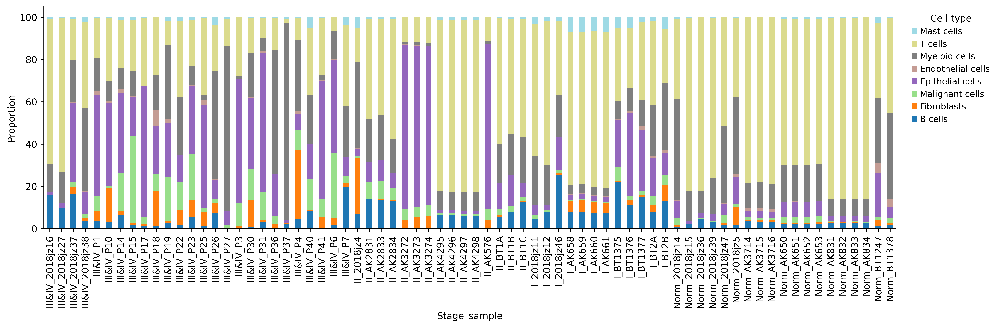

In [133]:
fig, ax = plt.subplots(dpi=300, figsize=(15, 5))
props.plot(kind="bar", stacked=True, ax=ax, legend=None, colormap='tab20')
# Matplotlib idiom to reverse legend entries 
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),bbox_to_anchor=(1.01, 1), frameon=False, title="Cell type")
sns.despine(fig, ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel(props.index.name.capitalize())
ax.set_ylabel("Proportion")
fig.patch.set_facecolor("white")
plt.grid(False)
#sc.settings.set_figure_params(fontsize=10, figsize=(5, 25))
fig.tight_layout()
fig.savefig('figures/fraction+.pdf')

In [156]:
emcan.write('K135_lusc.h5ad')

... storing 'subtype' as categorical


In [155]:
emcan.obs

,Tissue,Disease,Stage,CellName,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,source,sample,patient,leiden_0.8,leiden_1,cell type,cnv_leiden,cnv_score,cnv_status,stage_group,stage_sample,subtype
2018jz11_AAACCTGAGGGATCTG-1,Tumor,LUSC,I,CD4,1040,3446.0,68.0,1.973302,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11,Helper T cells
2018jz11_AAACCTGCACATTCGA-1,Tumor,LUSC,I,CD8,922,1937.0,52.0,2.684564,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11,Naïve T cells
2018jz11_AAACCTGGTCAGGACA-1,Tumor,LUSC,I,NE,1534,4462.0,613.0,13.738234,wchscu,2018jz11,PS02,0,2,Malignant cells,13,0.012374,tumor,I,I_2018jz11,Malignant cells
2018jz11_AAACCTGTCAAAGACA-1,Tumor,LUSC,I,B,1020,3251.0,138.0,4.244848,wchscu,2018jz11,PS02,12,13,B cells,18,0.003416,normal,I,I_2018jz11,B cells
2018jz11_AAACGGGCATACTCTT-1,Tumor,LUSC,I,B,707,1739.0,34.0,1.955147,wchscu,2018jz11,PS02,12,13,B cells,15,0.004665,normal,I,I_2018jz11,B cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P41_TATAAGTGTCTT-59,unknown,LUSC,unknown,unknown,570,979.0,238.0,24.310520,shsfkyy,P41,P41,14,15,Epithelial cells,22,0.002906,normal,III&IV,III&IV_P41,Basal cells
P41_ATGATCACGAGT-59,unknown,LUSC,unknown,unknown,534,966.0,140.0,14.492753,shsfkyy,P41,P41,9,10,Fibroblasts,3,0.014791,normal,III&IV,III&IV_P41,Fibroblasts
P41_CTGACGGTGAAA-59,unknown,LUSC,unknown,unknown,503,959.0,46.0,4.796663,shsfkyy,P41,P41,8,9,Myeloid cells,7,0.004850,normal,III&IV,III&IV_P41,Monocytes
P41_TTAACTATTCAC-59,unknown,LUSC,unknown,unknown,500,914.0,234.0,25.601751,shsfkyy,P41,P41,9,10,Fibroblasts,7,0.004850,normal,III&IV,III&IV_P41,Fibroblasts


In [157]:
from scipy.stats import f_oneway

In [162]:
I_list = set([emcan.obs.loc[i,'stage_sample'] for i in emcan.obs.index if emcan.obs.loc[i,'stage_group']=='I'])
II_list = set([emcan.obs.loc[i,'stage_sample'] for i in emcan.obs.index if emcan.obs.loc[i,'stage_group']=='II'])
IIIIV_list = set([emcan.obs.loc[i,'stage_sample'] for i in emcan.obs.index if emcan.obs.loc[i,'stage_group']=='III&IV'])
Norm_list = set([emcan.obs.loc[i,'stage_sample'] for i in emcan.obs.index if emcan.obs.loc[i,'stage_group']=='Norm'])

In [175]:
for ct in ctList:
    print(ct,'-> pvalue:')
    print(f_oneway(props.loc[I_list,ct],
             props.loc[II_list,ct],
             props.loc[IIIIV_list,ct],
             props.loc[Norm_list,ct]).pvalue)

Mast cells -> pvalue:
8.750286260544632e-11
T cells -> pvalue:
4.239265628760841e-08
Myeloid cells -> pvalue:
0.15380264002845812
Endothelial cells -> pvalue:
0.2064854226077204
Epithelial cells -> pvalue:
0.002028562540617596
Malignant cells -> pvalue:
0.0001733512744718908
Fibroblasts -> pvalue:
0.12438006445596714
B cells -> pvalue:
2.7227153362863504e-05


/tmp/ipykernel_272037/608974009.py:3: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  print(f_oneway(props.loc[I_list,ct],
/tmp/ipykernel_272037/608974009.py:4: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  props.loc[II_list,ct],
/tmp/ipykernel_272037/608974009.py:5: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  props.loc[IIIIV_list,ct],
/tmp/ipykernel_272037/608974009.py:6: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  props.loc[Norm_list,ct]).pvalue)
/tmp/ipykernel_272037/608974009.py:3: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  print(f_oneway(props.loc[I_list,ct],
/tmp/ipykernel_272037/608974009.py:4: FutureWarning: Passing a set as an indexe

In [169]:
props['stage'] = [i.split('_')[0] for i in props.index]
props

cell type,B cells,Fibroblasts,Malignant cells,Epithelial cells,Endothelial cells,Myeloid cells,T cells,Mast cells,stage
stage_sample,,,,,,,,,
III&IV_2018jz16,15.714286,0.000000,0.098522,1.724138,0.000000,13.054187,68.719212,0.689655,III&IV
III&IV_2018jz27,9.618875,0.000000,0.120992,2.177858,0.000000,15.003025,72.655777,0.423472,III&IV
III&IV_2018jz37,16.425509,3.081458,2.518757,37.406217,0.428725,19.989282,19.480171,0.669882,III&IV
III&IV_2018jz38,3.726454,1.433251,1.678952,10.647011,0.491400,39.107289,40.663391,2.252252,III&IV
III&IV_P1,3.385368,5.096859,7.052849,47.526801,2.294527,15.459846,18.600715,0.583036,III&IV
...,...,...,...,...,...,...,...,...,...
Norm_AK832,2.747253,0.173511,0.404858,2.515905,0.028918,8.010411,85.974552,0.144592,Norm
Norm_AK833,2.883472,0.178359,0.445898,2.467301,0.029727,8.204518,85.671819,0.118906,Norm
Norm_AK834,2.706636,0.174622,0.465658,2.415600,0.029104,8.032596,86.117579,0.058207,Norm


In [170]:
props.to_csv('proportion/K135_proportion_all.csv', index=True, header=True)#violin plot by R

# subtype

In [152]:
Epi_obs = pd.read_csv('K135_lusc_Epi_obs.csv', index_col=0)
Mye_obs = pd.read_csv('K135_lusc_Mye_obs.csv', index_col=0)
T_obs = pd.read_csv('K135_lusc_T_obs.csv', index_col=0)
subtype_df = pd.concat([Epi_obs,Mye_obs,T_obs])
subtype_df

,Tissue,Disease,Stage,CellName,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,source,sample,...,cell type,cnv_leiden,cnv_score,cnv_status,stage_group,stage_sample,leiden_1,subtype,leiden_0.8,leiden_0.6
2018jz11_AAACGGGGTACGCACC-1,Tumor,LUSC,I,ATII,2207,9363.0,613.0,6.547047,wchscu,2018jz11,...,Epithelial cells,0.0,0.008762,normal,I,I_2018jz11,1,AT2 cells,NaN,NaN
2018jz11_AAAGATGGTCGCGAAA-1,Tumor,LUSC,I,CD4,588,1598.0,572.0,35.794743,wchscu,2018jz11,...,Epithelial cells,4.0,0.010677,normal,I,I_2018jz11,8,Basal cells,NaN,NaN
2018jz11_AAAGCAAAGATCCCAT-1,Tumor,LUSC,I,ATII,732,1646.0,466.0,28.311057,wchscu,2018jz11,...,Epithelial cells,4.0,0.010677,normal,I,I_2018jz11,0,Basal cells,NaN,NaN
2018jz11_AAAGCAAAGGGCTTCC-1,Tumor,LUSC,I,ATII,563,1012.0,95.0,9.387352,wchscu,2018jz11,...,Epithelial cells,0.0,0.008762,normal,I,I_2018jz11,3,Club cells,NaN,NaN
2018jz11_AAAGTAGCAGACGCTC-1,Tumor,LUSC,I,ATII,702,2447.0,666.0,27.217000,wchscu,2018jz11,...,Epithelial cells,18.0,0.003416,normal,I,I_2018jz11,1,AT2 cells,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P41_GCCAGGTATGAA-59,unknown,LUSC,unknown,unknown,596,1001.0,117.0,11.688312,shsfkyy,P41,...,T cells,NaN,NaN,NaN,III&IV,III&IV_P41,0,Naïve T cells,0.0,NaN
P41_CTATTCCTTAGC-59,unknown,LUSC,unknown,unknown,554,987.0,224.0,22.695034,shsfkyy,P41,...,T cells,NaN,NaN,NaN,III&IV,III&IV_P41,6,CD4+ T cells,6.0,NaN
P41_TAAATTATGGAG-59,unknown,LUSC,unknown,unknown,597,993.0,139.0,13.997986,shsfkyy,P41,...,T cells,NaN,NaN,NaN,III&IV,III&IV_P41,0,Naïve T cells,0.0,NaN
P41_CGTTAAGAAGCG-59,unknown,LUSC,unknown,unknown,517,1012.0,61.0,6.027668,shsfkyy,P41,...,T cells,NaN,NaN,NaN,III&IV,III&IV_P41,11,Naïve T cells,0.0,NaN


In [153]:
emcan.obs['subtype'] = [subtype_df.loc[i,'subtype'] if i in subtype_df.index 
                        else emcan.obs.loc[i,'cell type'] 
                        for i in emcan.obs.index]
set(emcan.obs['subtype'])

{'AT1 cells',
 'AT2 cells',
 'B cells',
 'Basal cells',
 'CD4+ T cells',
 'CD8+ T cells',
 'Ciliated cells',
 'Club cells',
 'Deuterosomal cells',
 'Endothelial cells',
 'Exhausted T cells',
 'Fibroblasts',
 'Helper T cells',
 'Macrophages',
 'Malignant cells',
 'Mast cells',
 'Monocytes',
 'NK cells',
 'Naïve T cells',
 'Regulator T cells',
 'cDC1',
 'cDC2',
 'mDC',
 'pDC'}

In [177]:
emcan.obs

,Tissue,Disease,Stage,CellName,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,source,sample,patient,leiden_0.8,leiden_1,cell type,cnv_leiden,cnv_score,cnv_status,stage_group,stage_sample,subtype
2018jz11_AAACCTGAGGGATCTG-1,Tumor,LUSC,I,CD4,1040,3446.0,68.0,1.973302,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11,Helper T cells
2018jz11_AAACCTGCACATTCGA-1,Tumor,LUSC,I,CD8,922,1937.0,52.0,2.684564,wchscu,2018jz11,PS02,3,4,T cells,2,0.005820,normal,I,I_2018jz11,Naïve T cells
2018jz11_AAACCTGGTCAGGACA-1,Tumor,LUSC,I,NE,1534,4462.0,613.0,13.738234,wchscu,2018jz11,PS02,0,2,Malignant cells,13,0.012374,tumor,I,I_2018jz11,Malignant cells
2018jz11_AAACCTGTCAAAGACA-1,Tumor,LUSC,I,B,1020,3251.0,138.0,4.244848,wchscu,2018jz11,PS02,12,13,B cells,18,0.003416,normal,I,I_2018jz11,B cells
2018jz11_AAACGGGCATACTCTT-1,Tumor,LUSC,I,B,707,1739.0,34.0,1.955147,wchscu,2018jz11,PS02,12,13,B cells,15,0.004665,normal,I,I_2018jz11,B cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P41_TATAAGTGTCTT-59,unknown,LUSC,unknown,unknown,570,979.0,238.0,24.310520,shsfkyy,P41,P41,14,15,Epithelial cells,22,0.002906,normal,III&IV,III&IV_P41,Basal cells
P41_ATGATCACGAGT-59,unknown,LUSC,unknown,unknown,534,966.0,140.0,14.492753,shsfkyy,P41,P41,9,10,Fibroblasts,3,0.014791,normal,III&IV,III&IV_P41,Fibroblasts
P41_CTGACGGTGAAA-59,unknown,LUSC,unknown,unknown,503,959.0,46.0,4.796663,shsfkyy,P41,P41,8,9,Myeloid cells,7,0.004850,normal,III&IV,III&IV_P41,Monocytes
P41_TTAACTATTCAC-59,unknown,LUSC,unknown,unknown,500,914.0,234.0,25.601751,shsfkyy,P41,P41,9,10,Fibroblasts,7,0.004850,normal,III&IV,III&IV_P41,Fibroblasts


# 画图

In [3]:
emcan = sc.read('K135_lusc.h5ad')
emcan

AnnData object with n_obs × n_vars = 179506 × 2000
    obs: 'Tissue', 'Disease', 'Stage', 'CellName', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'source', 'sample', 'patient', 'leiden_0.8', 'leiden_1', 'cell type', 'cnv_leiden', 'cnv_score', 'cnv_status', 'stage_group', 'stage_sample', 'subtype'
    var: 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'cell type_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'dendrogram_leiden_0.8', 'dendrogram_leiden_1', 'hvg', 'leiden', 'leiden_0.8_colors', 'leiden_1_colors', 'neighbors', 'pca', 'sample_colors', 'source_colors', 'umap'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'cnv_neighbors_connectivities', 'cnv_neighbors_distances', 'connectivities', 'distances'

In [5]:
souDict = {'shsfkyy':'GSE148071','wchscu':'WCH'}
emcan.obs['source'] = [souDict[i] for i in emcan.obs['source']]
emcan.obs['source']

2018jz11_AAACCTGAGGGATCTG-1          WCH
2018jz11_AAACCTGCACATTCGA-1          WCH
2018jz11_AAACCTGGTCAGGACA-1          WCH
2018jz11_AAACCTGTCAAAGACA-1          WCH
2018jz11_AAACGGGCATACTCTT-1          WCH
                                 ...    
P41_TATAAGTGTCTT-59            GSE148071
P41_ATGATCACGAGT-59            GSE148071
P41_CTGACGGTGAAA-59            GSE148071
P41_TTAACTATTCAC-59            GSE148071
P41_TTACGCTTACCT-59            GSE148071
Name: source, Length: 179506, dtype: object

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


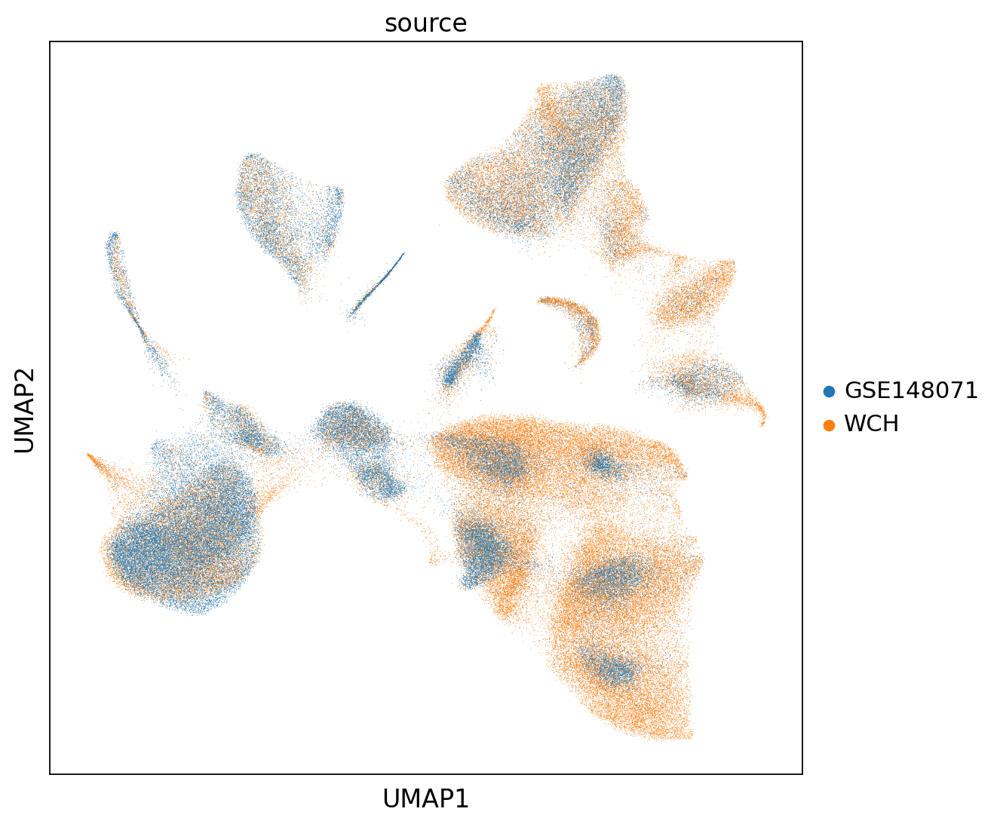

In [22]:
sc.settings.set_figure_params(fontsize=15, figsize=(8,8))
sc.pl.umap(emcan, color=['source'], ncols=2, palette=sc.pl.palettes.vega_20_scanpy, save='-source')

In [10]:
emcan.obs['cell_type'] = ['Epithelial cells' if i=='Malignant cells'
                          else i 
                          for i in emcan.obs['cell type']]
emcan.obs['cell_type']

2018jz11_AAACCTGAGGGATCTG-1             T cells
2018jz11_AAACCTGCACATTCGA-1             T cells
2018jz11_AAACCTGGTCAGGACA-1    Epithelial cells
2018jz11_AAACCTGTCAAAGACA-1             B cells
2018jz11_AAACGGGCATACTCTT-1             B cells
                                     ...       
P41_TATAAGTGTCTT-59            Epithelial cells
P41_ATGATCACGAGT-59                 Fibroblasts
P41_CTGACGGTGAAA-59               Myeloid cells
P41_TTAACTATTCAC-59                 Fibroblasts
P41_TTACGCTTACCT-59            Epithelial cells
Name: cell_type, Length: 179506, dtype: object

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


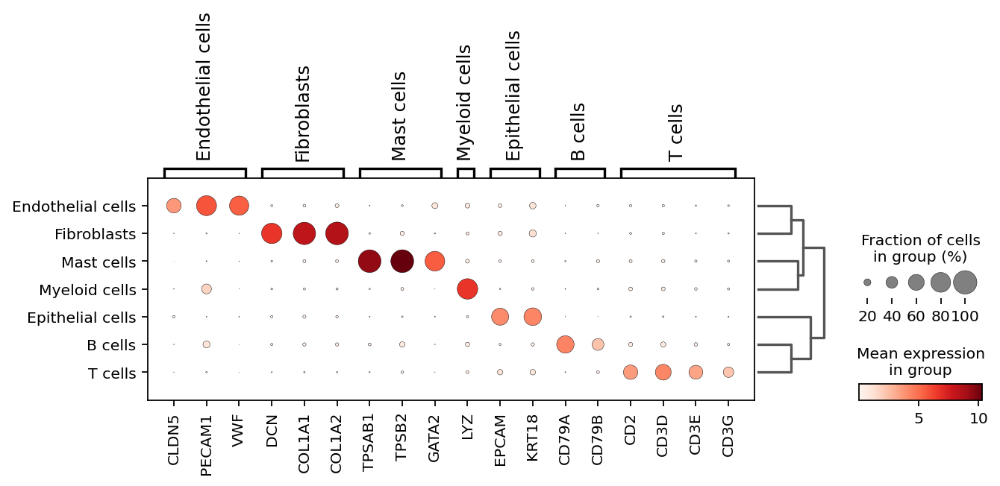

In [23]:
sc.settings.set_figure_params(fontsize=11, figsize=(8,8))
markerDict = {
'B cells':['CD79A','CD79B'],
'T cells':['CD2','CD3D','CD3E','CD3G'],
'Myeloid cells':['LYZ'],
'Mast cells':['TPSAB1','TPSB2','GATA2'],
'Endothelial cells':['CLDN5','PECAM1','VWF'],
'Epithelial cells':["EPCAM","KRT18"],
'Fibroblasts':['DCN','COL1A1','COL1A2']
}
sc.pl.dotplot(emcan, markerDict, groupby='cell_type', dendrogram=True, save='-cell type')

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


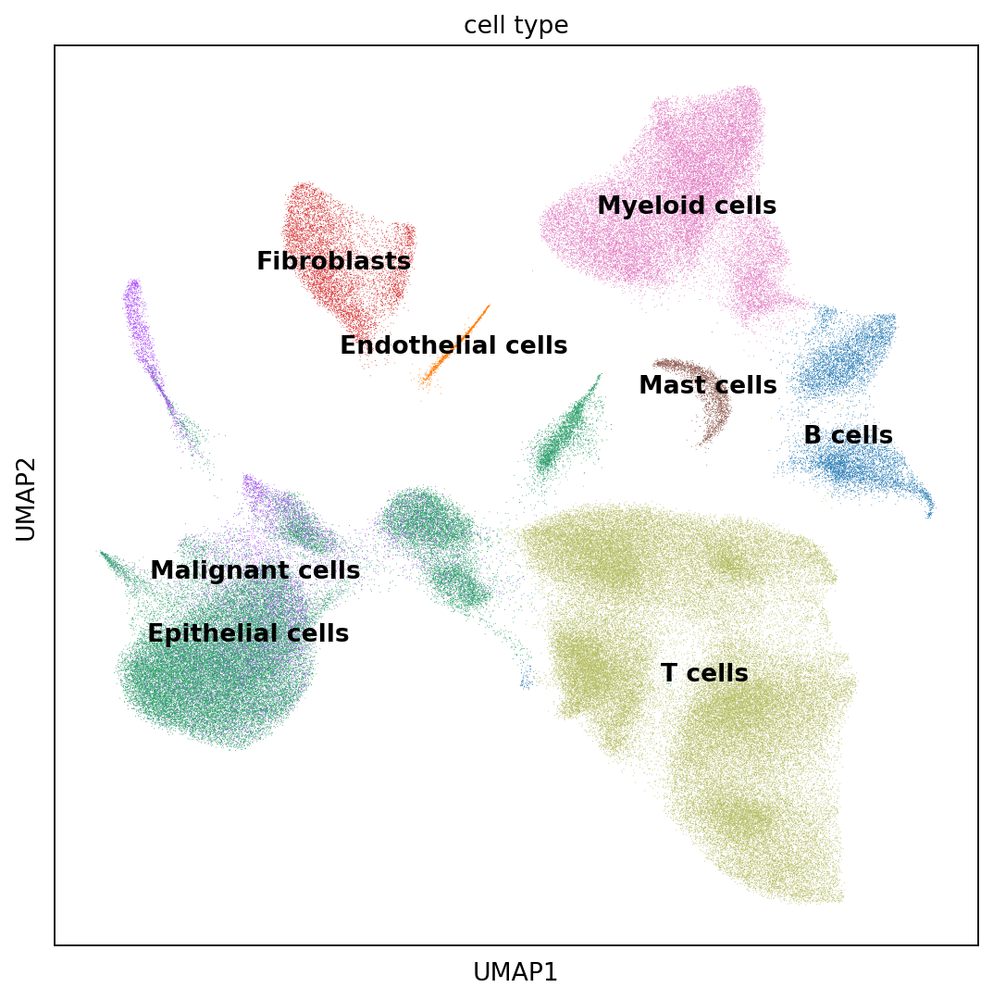

In [26]:
sc.settings.set_figure_params(fontsize=12, figsize=(8,8))
sc.pl.umap(emcan, color=['cell type'], ncols=2, legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy, save='-cell type')